In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt

In [3]:
data = pd.read_csv('动态表.csv')
data

,vid,daq_time,status,c_stat,soc,lng,lat,pdate
0,0061279dd54b448d8f6968d95c2a1b46,20191001002233,2.0,1.0,86.0,117240434.0,42405658.0,2019-10-01
1,000705b4-e831-4721-bbd5-bd1efcea22de,20191001221121,2.0,1.0,18.0,116666550.0,39744762.0,2019-10-01
2,0218g,20191001180821,2.0,1.0,73.0,116855667.0,40369406.0,2019-10-01
3,0208f0bd35ec41a5a5652a0bf77659ed,20191001085427,2.0,3.0,99.0,116133968.0,40139240.0,2019-10-01
4,0061279dd54b448d8f6968d95c2a1b46,20191001133424,1.0,3.0,76.0,117692701.0,42593310.0,2019-10-01
...,...,...,...,...,...,...,...,...
3165639,02d2a254a0044667bbd0c3601e1be035,20191231074222,1.0,3.0,70.0,116461325.0,38863221.0,2019-12-31
3165640,0196c1e9a14f46e78efa4750ca7abaf1,20191231215739,2.0,1.0,35.0,NaN,NaN,2019-12-31
3165641,0295df6121964afda16b9e0fc198e3c6,20191231133517,1.0,3.0,70.0,116024485.0,39707008.0,2019-12-31
3165642,02a6ff7698fb412ca928739e0b3703aa,20191231132845,1.0,3.0,68.0,116350100.0,39923610.0,2019-12-31


In [4]:
# 把同一辆车的数据放在一起并按时间顺序排列
data = data.sort_values(by=['vid','daq_time'])
data

,vid,daq_time,status,c_stat,soc,lng,lat,pdate
6224,0000569a867e4893bb57fbed89464483,20191001174551,1.0,3.0,100.0,NaN,NaN,2019-10-01
14353,0000569a867e4893bb57fbed89464483,20191001184931,2.0,3.0,80.0,NaN,NaN,2019-10-01
12964,0000569a867e4893bb57fbed89464483,20191001185903,1.0,3.0,80.0,NaN,NaN,2019-10-01
18220,0000569a867e4893bb57fbed89464483,20191002074133,2.0,3.0,79.0,NaN,NaN,2019-10-02
23772,0000569a867e4893bb57fbed89464483,20191002074223,1.0,3.0,79.0,NaN,NaN,2019-10-02
...,...,...,...,...,...,...,...,...
3155693,02d2a254a0044667bbd0c3601e1be035,20191231235556,2.0,1.0,30.0,116297289.0,38961176.0,2019-12-31
3138119,02d2a254a0044667bbd0c3601e1be035,20191231235606,2.0,1.0,30.0,116297278.0,38961141.0,2019-12-31
3159255,02d2a254a0044667bbd0c3601e1be035,20191231235616,2.0,1.0,30.0,116297265.0,38961092.0,2019-12-31
3143784,02d2a254a0044667bbd0c3601e1be035,20191231235626,2.0,1.0,30.0,116297228.0,38961037.0,2019-12-31


In [5]:
# 时间信息处理
data['time'] = data['daq_time'].apply(lambda x: str(x)[:4]+'-'+str(x)[4:6]+'-'+str(x)[6:8]+' '+str(x)[8:10]+':'+str(x)[10:12]+':'+str(x)[12:])
data

,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time
6224,0000569a867e4893bb57fbed89464483,20191001174551,1.0,3.0,100.0,NaN,NaN,2019-10-01,2019-10-01 17:45:51
14353,0000569a867e4893bb57fbed89464483,20191001184931,2.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:49:31
12964,0000569a867e4893bb57fbed89464483,20191001185903,1.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:59:03
18220,0000569a867e4893bb57fbed89464483,20191002074133,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:41:33
23772,0000569a867e4893bb57fbed89464483,20191002074223,1.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:23
...,...,...,...,...,...,...,...,...,...
3155693,02d2a254a0044667bbd0c3601e1be035,20191231235556,2.0,1.0,30.0,116297289.0,38961176.0,2019-12-31,2019-12-31 23:55:56
3138119,02d2a254a0044667bbd0c3601e1be035,20191231235606,2.0,1.0,30.0,116297278.0,38961141.0,2019-12-31,2019-12-31 23:56:06
3159255,02d2a254a0044667bbd0c3601e1be035,20191231235616,2.0,1.0,30.0,116297265.0,38961092.0,2019-12-31,2019-12-31 23:56:16
3143784,02d2a254a0044667bbd0c3601e1be035,20191231235626,2.0,1.0,30.0,116297228.0,38961037.0,2019-12-31,2019-12-31 23:56:26


In [6]:
data = data.reset_index(drop=True)
data.head(20)

,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time
0,0000569a867e4893bb57fbed89464483,20191001174551,1.0,3.0,100.0,NaN,NaN,2019-10-01,2019-10-01 17:45:51
1,0000569a867e4893bb57fbed89464483,20191001184931,2.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:49:31
2,0000569a867e4893bb57fbed89464483,20191001185903,1.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:59:03
3,0000569a867e4893bb57fbed89464483,20191002074133,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:41:33
4,0000569a867e4893bb57fbed89464483,20191002074223,1.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:23
5,0000569a867e4893bb57fbed89464483,20191002074243,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:43
6,0000569a867e4893bb57fbed89464483,20191006093312,1.0,3.0,79.0,NaN,NaN,2019-10-06,2019-10-06 09:33:12
7,0000569a867e4893bb57fbed89464483,20191006162255,2.0,3.0,72.0,NaN,NaN,2019-10-06,2019-10-06 16:22:55
8,0000569a867e4893bb57fbed89464483,20191006225317,1.0,3.0,72.0,NaN,NaN,2019-10-06,2019-10-06 22:53:17
9,0000569a867e4893bb57fbed89464483,20191007110500,2.0,3.0,69.0,NaN,NaN,2019-10-07,2019-10-07 11:05:00


In [7]:
data[(data['vid']=='0000569a867e4893bb57fbed89464483') & (data['soc']==100)]['c_stat'].unique()

array([3., 4.])

In [8]:
data[(data['vid']=='0000569a867e4893bb57fbed89464483') & (data['c_stat']==4)]

,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time
2931,0000569a867e4893bb57fbed89464483,20191025123310,2.0,4.0,100.0,116302773.0,39879020.0,2019-10-25,2019-10-25 12:33:10
2932,0000569a867e4893bb57fbed89464483,20191025123320,2.0,4.0,100.0,116302754.0,39879039.0,2019-10-25,2019-10-25 12:33:20
2933,0000569a867e4893bb57fbed89464483,20191025123330,2.0,4.0,100.0,116302754.0,39879048.0,2019-10-25,2019-10-25 12:33:30
9206,0000569a867e4893bb57fbed89464483,20191028150812,2.0,4.0,100.0,116302714.0,39879140.0,2019-10-28,2019-10-28 15:08:12
9207,0000569a867e4893bb57fbed89464483,20191028150822,2.0,4.0,100.0,116302722.0,39879125.0,2019-10-28,2019-10-28 15:08:22
9208,0000569a867e4893bb57fbed89464483,20191028150832,2.0,4.0,100.0,116302729.0,39879115.0,2019-10-28,2019-10-28 15:08:32
12300,0000569a867e4893bb57fbed89464483,20191031120727,2.0,4.0,100.0,116302790.0,39878963.0,2019-10-31,2019-10-31 12:07:27
12301,0000569a867e4893bb57fbed89464483,20191031120737,2.0,4.0,100.0,116302799.0,39878956.0,2019-10-31,2019-10-31 12:07:37
12302,0000569a867e4893bb57fbed89464483,20191031120747,2.0,4.0,100.0,116302827.0,39878912.0,2019-10-31,2019-10-31 12:07:47
25268,0000569a867e4893bb57fbed89464483,20191107194412,2.0,4.0,100.0,116302859.0,39878368.0,2019-11-07,2019-11-07 19:44:12


In [9]:
# 该记录结束之后是否有充电行为
data['soc_shift'] = data['soc'].shift(-1) - data['soc']
data['flag'] = data['soc_shift'].apply(lambda x: 1 if x>0 else 0)

In [10]:
data.head(30)

,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time,soc_shift,flag
0,0000569a867e4893bb57fbed89464483,20191001174551,1.0,3.0,100.0,NaN,NaN,2019-10-01,2019-10-01 17:45:51,-20.0,0
1,0000569a867e4893bb57fbed89464483,20191001184931,2.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:49:31,0.0,0
2,0000569a867e4893bb57fbed89464483,20191001185903,1.0,3.0,80.0,NaN,NaN,2019-10-01,2019-10-01 18:59:03,-1.0,0
3,0000569a867e4893bb57fbed89464483,20191002074133,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:41:33,0.0,0
4,0000569a867e4893bb57fbed89464483,20191002074223,1.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:23,0.0,0
5,0000569a867e4893bb57fbed89464483,20191002074243,2.0,3.0,79.0,NaN,NaN,2019-10-02,2019-10-02 07:42:43,0.0,0
6,0000569a867e4893bb57fbed89464483,20191006093312,1.0,3.0,79.0,NaN,NaN,2019-10-06,2019-10-06 09:33:12,-7.0,0
7,0000569a867e4893bb57fbed89464483,20191006162255,2.0,3.0,72.0,NaN,NaN,2019-10-06,2019-10-06 16:22:55,0.0,0
8,0000569a867e4893bb57fbed89464483,20191006225317,1.0,3.0,72.0,NaN,NaN,2019-10-06,2019-10-06 22:53:17,-3.0,0
9,0000569a867e4893bb57fbed89464483,20191007110500,2.0,3.0,69.0,NaN,NaN,2019-10-07,2019-10-07 11:05:00,0.0,0


In [22]:
data.iloc[50:55]

,vid,daq_time,status,c_stat,soc,lng,lat,pdate,time,soc_shift,flag
50,0000569a867e4893bb57fbed89464483,20191011172209,1.0,3.0,52.0,NaN,NaN,2019-10-11,2019-10-11 17:22:09,-52.0,0
51,0000569a867e4893bb57fbed89464483,20191011172417,2.0,3.0,0.0,NaN,NaN,2019-10-11,2019-10-11 17:24:17,52.0,1
52,0000569a867e4893bb57fbed89464483,20191011172619,2.0,1.0,52.0,NaN,NaN,2019-10-11,2019-10-11 17:26:19,-52.0,0
53,0000569a867e4893bb57fbed89464483,20191012074913,2.0,3.0,0.0,NaN,NaN,2019-10-12,2019-10-12 07:49:13,72.0,1
54,0000569a867e4893bb57fbed89464483,20191012081229,1.0,3.0,72.0,NaN,NaN,2019-10-12,2019-10-12 08:12:29,0.0,0


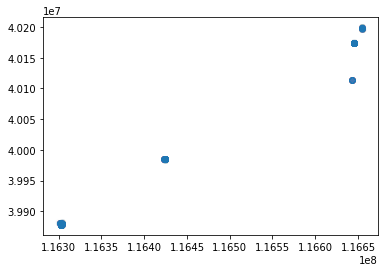

In [17]:
charging_phase = data[(data['c_stat']==1) & (data['vid']=='0000569a867e4893bb57fbed89464483')]
plt.scatter(charging_phase['lng'], charging_phase['lat'], alpha=0.01)

In [21]:
len(charging_phase), len(charging_phase2), len(charging_phase3)

(42449, 9075, 62849)

9075


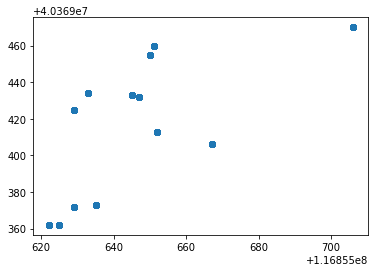

In [19]:
charging_phase2 = data[(data['c_stat']==1) & (data['vid']=='0218g')]
print (len(charging_phase2))
plt.scatter(charging_phase2['lng'], charging_phase2['lat'], alpha=0.01)

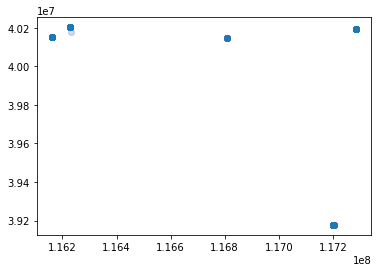

In [18]:
charging_phase3 = data[(data['c_stat']==1) & (data['vid']=='0208f0bd35ec41a5a5652a0bf77659ed')]
plt.scatter(charging_phase3['lng'], charging_phase3['lat'], alpha=0.01)